In [570]:
# Import packages

import re, nltk, spacy, string

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from pprint import pprint

import pyLDAvis
import pyLDAvis.sklearn
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import seaborn as sns

import os
import glob
import pandas as pd
import pickle
import heapq
import itertools
from sklearn.metrics.pairwise import linear_kernel

os.chdir('/home/matthew/anaconda3/envs/insight/staycationLA/notebooks')

In [571]:
#modified from 
#https://towardsdatascience.com/topic-modeling-quora-questions-with-lda-nmf-aff8dce5e1dd
#https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0
#https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0
#https://medium.com/@yanlinc/how-to-build-a-lda-topic-model-using-from-text-601cdcbfd3a6

In [572]:
#load data from NB01 scrape international city reviews
cities2 = pd.read_csv("../data/processed/cities_final_corpora.csv", index_col=None)
cities2

,city,english
0,istanbul,many place visit i ̇ capital city empire many ...
1,beijing,beijing good place learn happen travel sunday ...
2,phuket,must see last november rain cat dog pick day t...
3,santorini,christ modern times island perfect place spend...
4,cusco,cusco place cisco nice clean town architecture...
5,sydney,good thing warm sunny day coast walk city surr...
6,florence,great overview city great value see important ...
7,jaipur,pashmina shop visit friend mine beautiful pas...
8,luxor,luxor tour temple luxor valley king amazing ca...
9,marrakech,half half although part enjoy holiday glad go ...


In [573]:
#load data from NB04 LA attraction reviews combine
LA = pd.read_csv("../data/processed/LA_final_corpora.csv", index_col=None)
LA

,attraction,english,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,Universal_Studios_Hollywood,front line must family universal orlando la do...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.138416', '-118.35337')]",http://www.universalstudioshollywood.com/,Theme Parks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,36470,#1
1,Griffith_Observatory,griffith observatory another must see landmark...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.118492', '-118.30039')]",http://www.griffithobservatory.org/,Observatories & Planetariums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,20247,#2
2,Santa_Monica_Pier,end mother road must trip la pier iconic part ...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('34.01038', '-118.49594')]",http://santamonicapier.org/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,18866,#3
3,Hollywood_Walk_of_Fame,exciting crowded walk street hollywood think s...,https://www.tripadvisor.com/Attraction_Review-...,3.5,"[('34.1016', '-118.32672')]",http://www.walkoffame.com/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,17542,#4
4,The_Getty_Center,accidentally press wrong key get review page d...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.077564', '-118.474625')]",http://www.getty.edu/visit/center,Specialty Museums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,14503,#5
...,...,...,...,...,...,...,...,...,...,...,...
1330,Public_Art_You_Are_Not_Forgotten,powerful block inland beach art installation w...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1331,Mulholland_Memorial_Fountain,bring water city dry apt monument man remarkab...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1332,Hermit_Falls,hermit fall go lot close house easy take santa...,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269
1333,Ancient_Thai_Massage_and_Spa,great place de stress love go place area go ye...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269


In [574]:
LA.dropna(subset=['attraction'], inplace=True)
LA

,attraction,english,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,Universal_Studios_Hollywood,front line must family universal orlando la do...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.138416', '-118.35337')]",http://www.universalstudioshollywood.com/,Theme Parks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,36470,#1
1,Griffith_Observatory,griffith observatory another must see landmark...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.118492', '-118.30039')]",http://www.griffithobservatory.org/,Observatories & Planetariums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,20247,#2
2,Santa_Monica_Pier,end mother road must trip la pier iconic part ...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('34.01038', '-118.49594')]",http://santamonicapier.org/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,18866,#3
3,Hollywood_Walk_of_Fame,exciting crowded walk street hollywood think s...,https://www.tripadvisor.com/Attraction_Review-...,3.5,"[('34.1016', '-118.32672')]",http://www.walkoffame.com/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,17542,#4
4,The_Getty_Center,accidentally press wrong key get review page d...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.077564', '-118.474625')]",http://www.getty.edu/visit/center,Specialty Museums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,14503,#5
...,...,...,...,...,...,...,...,...,...,...,...
1330,Public_Art_You_Are_Not_Forgotten,powerful block inland beach art installation w...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1331,Mulholland_Memorial_Fountain,bring water city dry apt monument man remarkab...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1332,Hermit_Falls,hermit fall go lot close house easy take santa...,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269
1333,Ancient_Thai_Massage_and_Spa,great place de stress love go place area go ye...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269


In [575]:
combo = pd.concat([cities2, LA], axis=0)
combo

,city,english,attraction,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,istanbul,many place visit i ̇ capital city empire many ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,beijing,beijing good place learn happen travel sunday ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,phuket,must see last november rain cat dog pick day t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,santorini,christ modern times island perfect place spend...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cusco,cusco place cisco nice clean town architecture...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1330,NaN,powerful block inland beach art installation w...,Public_Art_You_Are_Not_Forgotten,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1.0,#269
1331,NaN,bring water city dry apt monument man remarkab...,Mulholland_Memorial_Fountain,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1.0,#269
1332,NaN,hermit fall go lot close house easy take santa...,Hermit_Falls,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1.0,#269
1333,NaN,great place de stress love go place area go ye...,Ancient_Thai_Massage_and_Spa,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1.0,#269


In [576]:
#find how many characters are in corpora for each city
combo['english'] = combo['english'].astype(str)
print (combo['english'].head(30).apply(lambda x: len(x)))

0      484951
1      379942
2      149423
3      213584
4      147182
5      147854
6      344863
7       74538
8      277567
9      224624
10     142115
11     115778
12     273567
13     219368
14     134905
15     214723
16     190341
17     217007
18     114141
19     166524
20     197993
21      99525
22      76257
23     169557
0     2617641
1     1070716
2     1280868
3      645862
4     2136082
5      816969
Name: english, dtype: int64


In [577]:
combo = combo.reset_index(drop=True)

# Get names of indexes for attractions with only 1 review
indexNames = combo[ combo['num_reviews'] == 1 ].index
# Delete these row indexes from dataFrame
combo.drop(indexNames , inplace=True)
# Get names of indexes for attractions with only 2 review
indexNames = combo[ combo['num_reviews'] == 2 ].index
# Delete these row indexes from dataFrame
combo.drop(indexNames , inplace=True)

combo = combo.reset_index(drop=True)
#truncate strings longer than 75,000 characters so that the international cities are weighted equally with the most popular LA attractions
combo['english2'] = combo['english'].str.slice(0, 75000)
len(combo)

1071

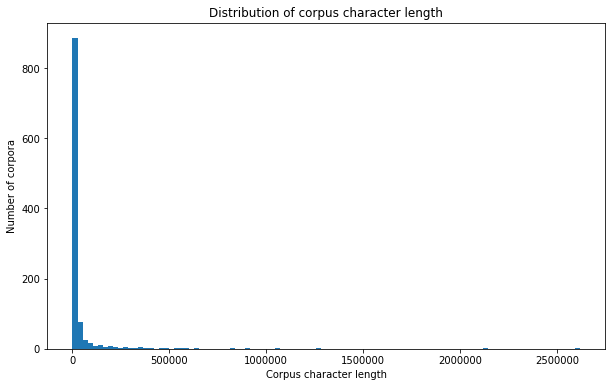

In [9]:
plt.figure(figsize=(10,6))
doc_lens = [len(d) for d in combo.english]
plt.hist(doc_lens, bins = 100)
plt.title('Distribution of corpus character length')
plt.ylabel('Number of corpora')
plt.xlabel('Corpus character length')
#sns.despine()
plt.show()

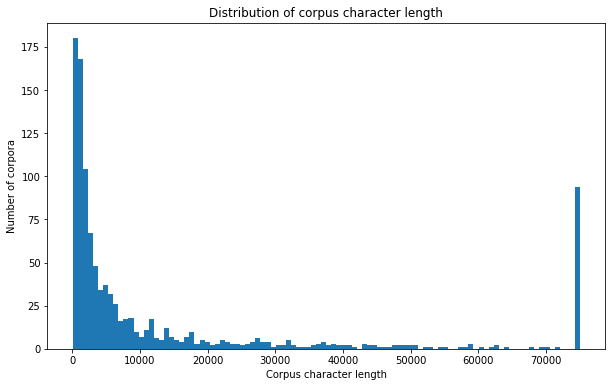

In [10]:
plt.figure(figsize=(10,6))
doc_lens = [len(d) for d in combo.english2]
plt.hist(doc_lens, bins = 100)
plt.title('Distribution of corpus character length')
plt.ylabel('Number of corpora')
plt.xlabel('Corpus character length')
#sns.despine()
plt.show()
#lower number of character length at 0 indicates removal of rows with 0 reviews

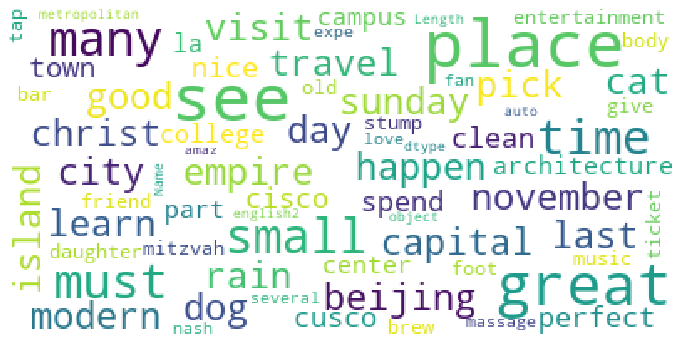

In [11]:

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

mpl.rcParams['figure.figsize']=(12.0,12.0)  
mpl.rcParams['font.size']=12            
mpl.rcParams['savefig.dpi']=100             
mpl.rcParams['figure.subplot.bottom']=.1 
stopwords = set(STOPWORDS)

wordcloud = WordCloud(
                          background_color='white',
                          stopwords=stopwords,
                          max_words=500,
                          max_font_size=40, 
                          random_state=42
                         ).generate(str(combo['english2']))

print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show();

In [122]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [123]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english', max_df = 0.4).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [129]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english', max_df = 0.3).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [13]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(combo['english2'], 20)
df3 = pd.DataFrame(common_words, columns = ['bigram' , 'count'])

fig = go.Figure([go.Bar(x=df3['bigram'], y=df3['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 bigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [14]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(combo['english2'], 20)
df4 = pd.DataFrame(common_words, columns = ['trigram' , 'count'])

fig = go.Figure([go.Bar(x=df4['trigram'], y=df4['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 trigrams in the question text"))
fig.show()

In [578]:
len(combo)

1071

In [579]:
#remove a few more weird attractions
combo = combo[~combo['attraction'].isin(['Psychiatry_An_Industry_of_Death'])]#scientology propaganda museum
combo = combo[~combo['attraction'].isin(['Foothill_Transit'])]#bus
combo = combo[~combo['attraction'].isin(['Williams_Hart_Transportation'])]#limo
combo = combo[~combo['attraction'].isin(['Union_Station'])]#transportation
combo = combo[~combo['attraction'].isin(['Museum_of_Death'])]#wierd museum
combo = combo[~combo['attraction'].isin(['WiFi_rental_around_world_Vision_Global_WiFi'])]#wierd museum
combo = combo[~combo['attraction'].isin(['Los_Angeles_Convention_Center'])]#convention center has many different events- don't want to just recommend the center itself
combo = combo[~combo['attraction'].isin(['Westfield_Culver_City'])]
combo = combo[~combo['attraction'].isin(['The_Late_Late_Show_with_Craig_Ferguson'])]
combo = combo[~combo['attraction'].isin(['Super_Silly_Fun_Land'])]#part of universal studios
combo = combo[~combo['attraction'].isin(['Bogies_at_the_Westlake_Village_Inn'])]
combo = combo[~combo['attraction'].isin(['Ten_Mile_Brewing_Company'])]
combo = combo[~combo['type'].isin(['Bar, Club & Pub Tours'])]
combo = combo[~combo['type'].isin(['Visitor Centers'])]
combo = combo[~combo['type'].isin(['Rides & Activities'])]
combo = combo[~combo['type'].isin(['Arenas & Stadiums'])]
combo = combo[~combo['type'].isin(['Breweries'])]
combo = combo[~combo['type'].isin(['Distilleries'])]
combo = combo[~combo['type'].isin(['Theme Parks'])]
combo = combo[~combo['type'].isin(['Water Parks'])]
combo = combo[~combo['type'].isin(['Sports Camps & Clinics'])]
#combo = combo[~combo['type'].isin(['Shopping Malls'])]
combo = combo.reset_index(drop=True)

In [580]:
len(combo)

987

In [581]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as esw
stopWords = ['town', "st", "www", "com", "lisboa", "lira", "hagia", "sophia", "baht", "phi", "yuan", "maria", "hermitage", "frank", "wright", "bob", "hollyhock", "harry", "madame", "lax", "tourist", "hotel", "taxi", "shuttle", "celebrity", "fan", "colorado", "pacific", "fame", "mary", "football", "roger", "charlie", "catalina", "universal", "studio", "potter", "bowl", "roller", "coaster", "observatory", "wax", "star", "rodeo", "transformer", "mummy", "aquarium", "muscle", "planetarium", "telescope", "manly", "poppy", "antelope", "goliath", "tar", "superman", "platinum", "throttle", "hurricane", "minion", "colossus", "arrive", "return", "travel", "subway", "book", "walt", "graham", "airport", "station", "bus", "country", "guide", "vera", "das", "ich", "ough", "broad", "die", "che","non", "ing", "ist", "pico", "culver", "cirque", "soleil", "academy", "kodak", "text", "shanghai", "air", "cab", "transport", "safe", "blade","cal", "gene", "holiday", "cruise", "security", "overnight", "terminal", "luggage", "porter", "speak", "homeless", "jeep", "channel", "conservancy", "pit", "fossil", "montana", "angel", "san", "dodger", "flash", "serial", "killer", "pedro", "forum", "union", "para", "sind", "bus", "bone", "tube", "rage", "lab", "tuck", "course", "dean", "martin", "jack", "joe", "card", "state", "peter", "dinosaur", "skeleton", "wir", "wird", "nach", "wert", "burg", "tor", "capital", "mammal", "jeopardy", "pressure", "sol", "villa", "flag", "foot", "vacation", "watt", "ark", "holocaust", "haulocaust", "sugar", "loaf", "welt", "figure", "hire", "police", "highland", "boulevard", "safety", "credit", "warner", "burbank", "paramount", "tony", "van", "las", "locker", "theme", "tip", "breakfast", "lunch", "episode", "shoot", "laker", "dinner", "dirty", "bank", "vine", "mark", "sign", "medina", "mit", "den", "duomo", "english", "driver", "christ", "revolution", "rum", "david", "piazza" ,"clipper", "mozart", "metro", "rancho", "greene", "man", "manhattan", "iowa", "pasadena", "cowboy", "oscar", "griffith", "disney", "dolby", "hollywood", "tussaud", "upgrade", "trump", "freeway","runyon","lloyd", "americana", "monroe", "venice", "santa", "simon", "wende", "visa", "man", "palisade", "belmont", "america", "huntington", "restaurant", "eat", "american", "meal", "paul", "money", "pound", "noah", "mile", "fry", "steak", "mash", "brunch", "menu", "salad", "bradbury", "baldwin", "arboretum", "lancaster", "gabriel", "arcadia", "anne", "week", "burger", "toyota", "centre", "center", "staple", "car", "meet", "nile", "sunday", "thursday", "monday", "tuesday", "wednesday", "watts", "ale", "brewery", "distillery", "beer", "wine", "convention", "conference", "racetrack", "rose", "friday", "saturday", "drink", "flight", "whiskey", "pub", "buffet", "grove", "tournament", "table", "apollo", "bar", "service", "expect", "change", "bed", "sandwich", "campus", "university", "cent", "coffee", "summer", "winter", "dine", "chain", "library", "winery", "taste", "tasting", "playhouse", "strip", "christmas", "cookie", "prop", "cocktail", "blood", "traffic", "chateau", "reserve", "membership", "birthday", "computer", "mall", "reservation", "season", "review", "company", "eric", "cup", "helpful", "school", "character", "memorabilia", "wilson", "online", "venue", "ave", "ask", "cafe", "pose", "unlimited", "dial", "craftsman", "party", "college", "campground", "liquor", "karen", "gin", "robin", "order", "drop", "weekend", "cheese", "chicken", "abbot", "bungee", "santee", "express", "whilst", "cheap", "mexico", "decide", "dining", "eatery", "marry", "brew", "hawthorne", "bottle", "ice", "cream", "wedding", "wells", "fargo", "stagecoach", "public", "final", "cost", "euro", "tram", "disneyland", "goldberg", "whittier",  "witch", "southwest", "appetizer", "touristy", "hop", "discount", "sickness", "private", "guided", "self", "fee", "ticket", "language", "wayfarer", "taping", "hope", "organise", "organize", "arrange", "contact", "haggle", "resort", "accommodation", "douglas", "capitol", "lodge", "makeup", "silence", "mike", "crime", "violence", "dangerous", "negative", "andrew", "sam", "smog", "fake", "henry", "ben", "michael", "jackson", "taylor", "metre", "swift", "award", "agua", "kirk", "leo", "porta", "potty", "diana", "tapa", "espana", "hassle", "divide", "norman", "orlando", "simpson", "sheraton", "lucy", "construction", "brooks", "graduate", "native", "transportation", "drug", "danger", "unsafe", "emergency", "flexible", "carlos", "expo", "chi", "tho", "vodka", "sum", "student", "victor", "hong", "email", "ruin", "concierge", "dim", "murder", "jones", "bel", "george", "lemmon", "rodney", "prom", "poor", "sausage", "capitan", "jimmy", "wrist", "wand", "jurassic", "furious", "daniel", "excursion", "towel", "inclusive", "transer", "december", "suicide", "november", "october", "september", "august", "july", "june", "may", "april", "february", "january", "portion", "passport", "bomb", "cos", "yen", "rebecca", "vermont", "enforcement", "gateway", "pork", "onion", "validate", "curtain", "feb", "catering", "nelson", "token", "nasa", "pint", "chili", "charles", "carl", "mel", "tap", "wristband", "bruce", "physics", "traveller", "negotiate", "operator", "fortune", "tape", "adam", "johnny", "walter", "agency", "traveller", "ease", "lincoln", "doctor", "terribly", "download", "nightmare", "concession", "cafeteria", "robert", "hamburger", "thomas", "attendant", "guinness", "dollar", "robinson", "graduation", "mar", "trailer", "housing", "gps", "ride", "bad", "marry", "marriage", "reception", "bride", "groom", "louis", "garlic", "king", "government", "welcome", "hospital", "clinic", "staff", "ask", "question", "directions", "questions", "direction", "kiosk", "lodging", "maps", "map", "mate", "endeavour", "polite", "cabin", "sauce", "apartment", "hospitality", "transfer", "headache", "suitcase", "network", "maximum", "courtesy", "drunk", "abroad", "lifelike", "realistic", "voucher", "griffin", "scott", "wayne", "outskirt", "deli", "bungalow", "elizabeth", "jane", "billy", "supper", "pierce",  "entree", "upset", "scare", "backbone", "rogers", "lee", "mandatory", "forbid","escape", "ban", "tue", "thirty", "marineland", "arizona", "mrs", "arroyo", "playa", "cell", "florida", "butter", "dale", "chip", "dana", "joshua", "yesterday", "firehouse", "booking", "hannibal", "madam", "diner", "fowler", "hammer", "beggar", "backpacker", "honeymoon", "monterey", "roosevelt", "bruin", "minus", "tiffany", "ron", "poop", "par", "infrastructure", "cheesecake", "bind", "spite", "wifi", "bartender", "sinatra", "boston", "platform", "eames", "fool", "engagement", "manager", "region", "route", "drought", "seedy", "wicked", "trojan", "alumnus", "ram", "tender", "fall", "teacher", "smallish", "beth", "catherine", "bloody", "classroom", "lesson", "workshop", "expert", "ensure", "web", "adjoin", "tub", "soup", "sick", "ralph", "official", "telephone", "payment", "immigration", "speech", "income", "twin", "clubhouse", "waiter", "premise", "milk", "soap", "separately", "olympic", "olympics", "checkout", "james", "battery", "representative", "bottled", "seven", "municipal", "blog", "horrible", "pain", "remodel", "mac", "insurance", "currency", "supermarket", "grocery", "beef", "ada", "arlington", "dorado", "ranger", "pillow", "altitude", "married", "receipt", "foreign", "garland", "parson", "monrovia", "agent", "appoint", "yearly", "equivalent", "agenda", "fri", "welcoming", "reliable", "sleep", "tourism", "fat", "wary", "rib", "alcoholic", "waitress", "smoke", "readily", "arrangement", "readily", "smoothly", "stupid", "williams", "wizard", "pie", "jeff", "ana", "sierra", "tom", "nasty", "complimentary", "viper", "mph", "dec", "pass", "acceptable", "dot", "egg", "cake", "rubbish", "garbage", "bedroom", "instructor", "exchange", "toast", "adjust", "scam", "medical", "insist", "leader", "boarding", "lounge", "departure", "arrival", "newport", "sketchy", "badly", "shortage", "houston", "bumper", "document", "gamble", "jan", "mar", "apr", "aug", "sep", "sept", "oct", "nov", "dec", "paseo", "davis", "ant", "cram", "flop", "seattle", "international", "hell", "scan", "fellow", "gracious", "custom", "asphalt", "atm", "culturally", "electronic", "bin", "layover", "stomach", "tot", "sights", "lane", "tire", "aka", "civic", "license", "signal", "refugee", "sat", "sun", "mon", "tue", "wed", "thur", "thurs", "communicate", "dvd", "refill", "rosa", "lean", "whisky", "desperate", "victoria", "miller", "yogurt", "robertson", "frustrating", "hostel", "insider", "texas", "tailgate", "grandstand", "bleacher", "academic", "professor", "cube", "chandler", "athlete", "unit", "nest", "salt", "horrendous", "touristic", "click", "application", "applicant", "championship", "portable", "foreigner", "suite", "chuck", "jay", "orientation", "potato", "citizen", "confirm", "economy", "escort", "wash", "british", "worry", "agree", "rely", "motel", "suburb", "department", "pool", "accent", "stressful", "patrol", "considerate", "glove", "preference", "canadian", "bakery", "galleria", "store", "downtown", "rate", "protect", "army", "stranger", "annoy", "stock", "assume", "usa", "host", "officer", "californian", "salmon", "broadway", "wall", "refuse", "triangle", "fly", "train", "plane", "aircraft", "pilot", "drive", "driving", "migration", "chin", "gap", "moore", "casino", "canada", "trade", "rob", "poorly", "male", "columbia", "bistro", "phoenix", "hospitable", "ate", "gal", "summertime", "spring", "weak", "waffle", "class", "academy", "dee", "blanc", "demille", "taxis", "threaten", "franklin", "poison", "inhabitant", "hut", "bond", "flood", "courteous", "beatles", "lease", "gambling", "hunter", "trap", "ford", "headquarters", "millionaire", "jaw", "fort", "surgery", "sherman", "elvis", "mars", "facility", "platter", "vincent", "masse", "sock", "wallet", "utilize", "utilise", "halloween", "petit", "tonight", "tomorrow", "relief", "edward", "rover", "lunchtime", "vegan", "vegetarian", "airline", "airplane", "passenger"] + ['aggressive', "teach", "beg", "boy", "mayor", "demand", "stamp", "decision", "client", "temp", "itinerary", "teaching", "information", "regional", "jet", "server", "honest", "carol", "coach", "alcohol", "script", "acquire", "condo", "develop", "development", "developing", "national", "exposition", "lamb", "autograph", "coupon", "invite", "cleanliness", "candy", "hometown", "continent", "rude", "feast", "simulator", "inn", "scratch", "dealer", "mail"] + list(esw) 
#additional keywords that didn't improve the model fit
# "tiffany", "ron", "poop", "par", "infrastructure", "cheesecake", "bind", "spite", "wifi", "bartender", "sinatra"
#aggressive, 'intimidate',

In [582]:
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=2,                       
                             stop_words=stopWords,             
                             lowercase=True,                   
                             token_pattern='[a-zA-Z0-9]{3,}',  
                             max_features=3200, 
                             max_df = 0.4                        )

data_vectorized = vectorizer.fit_transform(combo['english2'])

In [583]:
lda_model = LatentDirichletAllocation(n_components=50, # Number of topics
                                      learning_method='online',
                                      random_state=0,  
                                      doc_topic_prior = 8, # to increase # topics per document
                                      topic_word_prior = 0.000000001, #to decrease the # words per topic
                                      n_jobs = -1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_vectorized)

pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer, mds='tsne')

PreparedData(topic_coordinates=                x           y  topics  cluster      Freq
topic                                                   
12     116.508957   16.338161       1        1  8.507729
20     -99.002174   33.359692       2        1  5.961578
37     -99.575584  -52.432259       3        1  4.825970
26     -83.262459  -72.147491       4        1  3.840211
38     -12.255136   74.667297       5        1  3.592264
40      84.746788   -9.123776       6        1  3.070663
49     -66.407509   58.241333       7        1  2.830842
32     -99.816063  -10.425587       8        1  2.692816
25      74.956894  -78.640991       9        1  2.611163
5       47.351910  -80.368980      10        1  2.488989
35      46.119568   27.559904      11        1  2.414383
42      81.867783   57.607540      12        1  2.320323
31     -18.813978  -89.546074      13        1  2.319118
16      37.939426  -50.718227      14        1  2.250500
10      55.922306  -26.175121      15        1  2.217958
34      19.311605   79.630936      16        1  2.026205
33      55.111103   87.207283      17        1  1.959616
39     -41.736134  -64.667068      18        1  1.894324
3       76.642502   23.745731      19        1  1.891102
46     -48.170059   88.813316      20        1  1.840661
1      -54.260464  -12.826752      21        1  1.751244
29      14.069943  -95.104942      22        1  1.739793
6      -72.914337  -36.685768      23        1  1.728218
19      78.026306  -46.502563      24        1  1.725577
23     -14.564104  -50.555305      25        1  1.676515
41      -4.146276  107.990875      26        1  1.661594
14     -28.166746   32.188454      27        1  1.592850
28      10.337456  -61.372337      28        1  1.474641
8      -42.251305  -36.547993      29        1  1.449722
24     -52.044247 -101.306190      30        1  1.447762
30     -68.857864   10.892424      31        1  1.428181
7       16.325289   50.231594      32        1  1.414832
45     -54.700729   32.471462      33        1  1.386874
13     -37.215118   57.364155      34        1  1.376782
15      -8.267071   48.234203      35        1  1.368376
4       53.057289    2.607739      36        1  1.362387
43      42.680370   54.219471      37        1  1.335117
11      20.018847  -31.362822      38        1  1.071267
22      31.702229  -13.400741      39        1  1.048028
27      18.058298   25.931229      40        1  1.003560
36     -20.051329  -26.652864      41        1  0.982945
18     -38.645401   11.701994      42        1  0.972772
21     -28.001608   -7.982003      43        1  0.972410
2        0.137268  -27.679325      44        1  0.937233
17      26.092901    6.417712      45        1  0.936177
47      -7.455969   -8.064821      46        1  0.929695
0       11.765774  -10.397745      47        1  0.921549
9        5.723623    7.871902      48        1  0.919842
48     -15.299187    9.557567      49        1  0.914863
44      -3.778799   25.507454      50        1  0.912780, topic_info=         Term          Freq         Total Category  logprob  loglift
247     beach  13366.000000  13366.000000  Default  30.0000  30.0000
1815   museum  10569.000000  10569.000000  Default  29.0000  29.0000
1152   garden   4026.000000   4026.000000  Default  28.0000  28.0000
1497   island   3542.000000   3542.000000  Default  27.0000  27.0000
2067     pier   4098.000000   4098.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
1585    learn     25.443903   1924.621832  Topic50  -5.6593   0.3704
1269     hand     23.417988   1236.437843  Topic50  -5.7423   0.7299
1055     film     23.843487   1558.713377  Topic50  -5.7243   0.5163
794   display     24.132166   2244.360610  Topic50  -5.7123   0.1638
812       dog     23.916289   1882.469476  Topic50  -5.7212   0.3307

[2967 rows x 6 columns], token_table=      Topic      Freq Term
term                      
0         3  0.149667  aaa
0         5  0.033259  aaa
0        14  0.0831

In [584]:
import numpy as np
def show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

topic_keywords = show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20)

df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17,Word 18,Word 19
Topic 0,movie,museum,art,huge,unique,hill,young,nearby,line,photo,event,historic,west,gem,massage,super,display,retro,selection,age
Topic 1,game,stadium,rise,golf,event,seat,attend,line,sport,hole,team,flea,coliseum,concert,atmosphere,historic,field,huge,market,tee
Topic 2,photo,museum,art,hill,gem,picture,huge,event,display,picnic,program,road,site,gift,unique,music,selection,community,adult,feature
Topic 3,museum,collection,vehicle,antique,display,classic,vintage,automobile,vault,enthusiast,floor,music,restore,auto,musical,instrument,model,railroad,condition,docent
Topic 4,edinburgh,castle,royal,scotland,festival,hill,scottish,museum,story,weather,attraction,hat,break,buy,sight,second,simply,complete,historical,guy
Topic 5,concert,seat,music,picnic,sound,outdoor,greek,event,evening,stage,box,line,section,stack,option,hill,acoustic,wait,attend,band
Topic 6,music,museum,interactive,exhibit,floor,musical,display,record,video,road,artist,hear,listen,rock,instrument,sound,song,photo,lover,booth
Topic 7,florence,art,italy,museum,italian,gallery,sight,main,church,leather,site,square,buy,delicious,rome,plan,river,husband,best,michelangelo
Topic 8,race,horse,track,bet,racing,drag,event,mountain,afternoon,rider,seat,club,hot,box,attend,ground,admission,southern,stand,truck
Topic 9,museum,photo,unique,afternoon,event,sunset,line,movie,art,gem,light,actually,selection,picture,hill,busy,buy,story,neighborhood,young


In [651]:
Topics_theme = ['museums', 'games', 'pictures', 'cars and history', 'castles and history', 
                'performances', 'music', 'Italy', 'racing', 'museums and exploring', 
                'architecture', 'Spanish architecture', 'beaches', 'temples and boats', 'Europe and nature',                 
                'colonial architecture', 'animals', 'learning', 'parks', 'art deco design', 
                'hiking',  'museums and activities', 'movies and history', 'mountains and sacred places', 'markets and sports',  
                'theaters', 'art', 'relaxing', 'parades', 'scenery',  
                'China', 'nature', 'gardens', 'ships', 'islands', 
                'architecture and design', 'flying', 'exhibits', 'films', 'harbors', 
                'shopping', 'walking areas', 'memorials', 'war', 'art and museums', 
                'India', 'east Asia', 'pictures and art', 'exploring and museums', 'markets',                 
                 ]
df_topic_keywords['topic_theme'] = Topics_theme
df_topic_keywords.set_index('topic_theme', inplace=True)
df_topic_keywords.T

topic_theme,museums,games,pictures,cars and history,castles and history,performances,music,Italy,racing,museums and exploring,architecture,Spanish architecture,beaches,temples and boats,Europe and nature,colonial architecture,animals,learning,parks,art deco design,hiking,museums and activities,movies and history,mountains and sacred places,markets and sports,theaters,art,relaxing,parades,scenery,China,nature,gardens,ships,islands,architecture and design,flying,exhibits,films,harbors,shopping,walking areas,memorials,war,art and museums,India,east Asia,pictures and art,exploring and museums,markets
Word 0,movie,game,photo,museum,edinburgh,concert,music,florence,race,museum,hall,adobe,beach,temple,salzburg,havana,animal,museum,picnic,movie,hike,museum,movie,peru,market,theater,art,pine,parade,ocean,beijing,lake,garden,ship,island,berlin,soar,museum,movie,boat,shopping,canal,cemetery,petersburg,museum,palace,japanese,gift,museum,istanbul
Word 1,museum,stadium,museum,collection,castle,seat,museum,art,horse,photo,architecture,gift,pier,luxor,flower,cuba,zoo,gift,road,island,trail,picnic,ground,ethiopia,farmer,seat,museum,spa,float,chapel,chinese,garden,plant,queen,boat,docent,glider,exhibit,picture,cape,rio,product,mission,museum,photo,pink,tokyo,picture,gift,iceland
Word 2,art,rise,art,vehicle,royal,music,interactive,italy,track,unique,floor,museum,bike,boat,mountain,music,exhibit,event,hill,ballroom,road,learn,learn,museum,fresh,theatre,collection,avenue,seat,glass,china,tree,memorial,board,sea,tower,thank,display,photo,island,district,bridge,church,palace,unique,india,japan,museum,art,blue
Word 3,huge,golf,hill,antique,scotland,picnic,exhibit,museum,bet,afternoon,grand,historic,ocean,valley,music,cuban,touch,selection,trail,theater,hiking,activity,museum,road,fruit,movie,exhibit,relax,rise,church,pearl,nature,desert,deck,beach,architecture,southern,learn,famous,lighthouse,boutique,stroll,cathedral,russian,art,neon,sushi,super,gem,buy
Word 4,unique,event,gem,display,festival,sound,floor,italian,racing,event,hill,mexican,sunset,egypt,bloom,happy,sea,photo,site,art,rock,gem,gem,valley,produce,performance,sculpture,massage,band,bell,head,pond,ground,volunteer,ferry,design,road,exhibition,theatre,south,expensive,neighborhood,grave,church,gift,shopping,buy,art,huge,main
Word 5,hill,seat,picture,classic,hill,outdoor,musical,gallery,drag,sunset,central,afternoon,sand,site,orange,plus,tank,gem,hard,dance,canyon,young,hill,mountain,court,comfortable,gallery,ocean,line,ground,site,bird,botanical,battleship,sunset,medellin,professional,movie,film,waterfront,buy,skin,famous,russia,read,amber,culture,sunset,afternoon,expensive
Word 6,young,attend,huge,vintage,scottish,greek,display,sight,event,line,interior,site,path,hot,field,photo,shark,adult,huge,deco,mountain,hill,event,site,vendor,stage,artist,movie,event,peaceful,buy,duck,flower,war,blue,art,turn,story,theater,kayak,plaza,beach,bury,provide,provide,indian,plaza,photo,picture,thai
Word 7,nearby,line,event,automobile,museum,event,record,main,mountain,movie,movie,pueblo,dog,board,sound,architecture,adult,learn,evening,scene,island,picture,gift,cultural,basketball,production,modern,option,person,tree,line,turtle,mansion,military,white,craft,light,artifact,iconic,light,fashion,quiet,ground,river,picture,heritage,korean,unique,variety,market
Word 8,line,sport,display,vault,story,evening,video,church,afternoon,art,historic,buy,wave,thank,rain,buy,pet,age,tree,floor,point,gift,line,plaza,dog,sound,piece,quiet,seating,gorgeous,factory,relax,bloom,harbor,village,original,photo,war,chinese,beach,window,unique,peaceful,cathedral,hill,gate,shopping,line,allow,vietnam
Word 9,photo,hole,picnic,enthusiast,weather,stage,road,leather,rider,gem,film,picture,stroll,choice,valley,wish,learn,unique,event,mural,dog,age,buy,african,tennis,concert,contemporary,poker,list,coast,square,peaceful,tree,learn,greek,neighborhood,learn,informative,sunset,bay,clothe,walkway,memorial,art,gem,temple,sell,relax,movie,shoppi

In [619]:
## Create Document - Topic Matrix
lda_output = lda_model.transform(data_vectorized)

# column names
topicnames = df_topic_keywords.T.columns

# index names
docnames = ["Doc" + str(i) for i in range(len(combo))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

df_document_topic.reset_index(inplace=True)
df_sent_topic= pd.merge(combo, df_document_topic, left_index=True, right_index=True)
df_sent_topic.drop('index', axis=1, inplace=True)

df_topic_theme = df_sent_topic[['english', 'dominant_topic']]

def label_theme(row):

   
    if row['dominant_topic'] == 0:
        return 'China'
    if row['dominant_topic'] == 1:
        return 'beaches'
    if row['dominant_topic'] == 2:
        return 'islands'
    if row['dominant_topic'] == 3:
        return 'harbors'
    if row['dominant_topic'] == 4:
        return 'museums and art'
    if row['dominant_topic'] == 5:
        return 'beach activities'
    if row['dominant_topic'] == 6:
        return 'architecture'
    if row['dominant_topic'] == 7:
        return 'gardens'
    if row['dominant_topic'] == 8:
        return 'art'
    if row['dominant_topic'] == 9:
        return 'music'
    if row['dominant_topic'] == 10:
        return 'beaches and mountains'
    if row['dominant_topic'] == 11:
        return 'history'
    if row['dominant_topic'] == 12:
        return 'art museums'
    if row['dominant_topic'] == 13:
        return 'markets'
    if row['dominant_topic'] == 14:
        return 'golf'
    if row['dominant_topic'] == 15:
        return 'east Asia'
    if row['dominant_topic'] == 16:
        return 'animals and cemeteries'
    if row['dominant_topic'] == 17:
        return 'the Alps'
    if row['dominant_topic'] == 18:
        return 'plazas'
    if row['dominant_topic'] == 19:
        return 'movies'    
    if row['dominant_topic'] == 20:
        return 'film'
    if row['dominant_topic'] == 21:
        return 'movie museums'
    if row['dominant_topic'] == 22:
        return 'visual arts'
    if row['dominant_topic'] == 23:
        return 'castles'
    if row['dominant_topic'] == 24:
        return 'nature'
    if row['dominant_topic'] == 25:
        return 'performances and sports'
    if row['dominant_topic'] == 26:
        return 'movies and outdoors'
    if row['dominant_topic'] == 27:
        return 'movie and art museums'
    if row['dominant_topic'] == 28:
        return 'shopping'
    if row['dominant_topic'] == 29:
        return 'ships'
    if row['dominant_topic'] == 30:
        return 'theaters'
    if row['dominant_topic'] == 31:
        return 'Africa'
    if row['dominant_topic'] == 32:
        return 'temples'
    if row['dominant_topic'] == 33:
        return 'palaces and churches'
    if row['dominant_topic'] == 34:
        return 'the arts'
    if row['dominant_topic'] == 35:
        return 'museums'
    if row['dominant_topic'] == 36:
        return 'parades and cars'
    if row['dominant_topic'] == 37:
        return 'walking places'
    if row['dominant_topic'] == 38:
        return 'art galleries'
    if row['dominant_topic'] == 39:
        return 'beach sports'
    if row['dominant_topic'] == 40:
        return 'markets and sports'
    if row['dominant_topic'] == 41:
        return 'donations'
    if row['dominant_topic'] == 42:
        return 'hiking'
    if row['dominant_topic'] == 43:
        return 'exploring'
    if row['dominant_topic'] == 44:
        return 'island life'
    if row['dominant_topic'] == 45:
        return 'museums and outdoors'
    if row['dominant_topic'] == 46:
        return 'churches'
    if row['dominant_topic'] == 47:
        return 'spas and vineyards'
    if row['dominant_topic'] == 48:
        return 'aviation'
    if row['dominant_topic'] == 49:
        return 'visual art museums'

df_topic_theme['dominant_topic_theme'] = df_topic_theme.apply (lambda row: label_theme(row), axis=1)
df_topic_theme.tail(10)

<ipython-input-619-f26b0fa74df1>:127: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,english,dominant_topic,dominant_topic_theme
977,serve diverse congregation catholic parish fou...,0,China
978,magical place veteran parrot serenity park san...,33,palaces and churches
979,iconic culver city dive bar wife time kill stu...,0,China
980,great community park activity tennis basketbal...,24,nature
981,small museum sampling meteorite collection sma...,26,movies and outdoors
982,small big heart go production theater couple y...,25,performances and sports
983,small college center la campus part daughter c...,0,China
984,see g bar mitzvah friend give ticket see music...,6,architecture
985,great foot body massage several time love expe...,0,China
986,must see fan nash metropolitan auto small amaz...,3,harbors


In [620]:
df_topic_theme.head(30)

,english,dominant_topic,dominant_topic_theme
0,many place visit i ̇ capital city empire many ...,49,visual art museums
1,beijing good place learn happen travel sunday ...,30,theaters
2,must see last november rain cat dog pick day t...,49,visual art museums
3,christ modern times island perfect place spend...,34,the arts
4,cusco place cisco nice clean town architecture...,23,castles
5,good thing warm sunny day coast walk city surr...,20,film
6,great overview city great value see important ...,7,gardens
7,pashmina shop visit friend mine beautiful pas...,45,museums and outdoors
8,luxor tour temple luxor valley king amazing ca...,13,markets
9,half half although part enjoy holiday glad go ...,49,visual art museums


In [621]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

combolist = []
combo3=pd.DataFrame(combo['english'])
for row in combo3.itertuples():
    row2=[item for item in row if not isinstance(item, int)]
    mytext_4 = vectorizer.transform(row2)
    topic_probability_scores = lda_model.transform(mytext_4)
    #topic = combo_topic_keywords.iloc[np.argmax(topic_probability_scores), :].values.tolist()
    combolist.append(topic_probability_scores)
   

In [652]:
from itertools import chain
new_list = [x for x in chain.from_iterable(combolist)]
combo4 = pd.DataFrame.from_records(new_list)
combo4.columns = ['museums', 'games', 'pictures', 'cars and history', 'castles and history', 
                'performances', 'music', 'Italy', 'racing', 'museums and exploring', 
                'architecture', 'Spanish architecture', 'beaches', 'temples and boats', 'Europe and nature',                 
                'colonial architecture', 'animals', 'learning', 'parks', 'art deco design', 
                'hiking',  'museums and activities', 'movies and history', 'mountains and sacred places', 'markets and sports',  
                'theaters', 'art', 'relaxing', 'parades', 'scenery',  
                'China', 'nature', 'gardens', 'ships', 'islands', 
                'architecture and design', 'flying', 'exhibits', 'films', 'harbors', 
                'shopping', 'walking areas', 'memorials', 'war', 'art and museums', 
                'India', 'east Asia', 'pictures and art', 'exploring and museums', 'markets',                 
                 ]

In [653]:
combo_concat2 = pd.concat([combo, combo4], axis=1)
type(combo_concat2)
#combo_concat2.head(20)
combo_concat3=combo_concat2.drop(['attraction', "english", "english2", "city", "TA_url", "rating", "gps", "url", "type", "name", "pic", "num_reviews", "ranking"], axis=1)

combo_concat3.dropna(inplace=True)
pd.set_option('display.max_columns', None)
combo_concat3.head(20)

,museums,games,pictures,cars and history,castles and history,performances,music,Italy,racing,museums and exploring,architecture,Spanish architecture,beaches,temples and boats,Europe and nature,colonial architecture,animals,learning,parks,art deco design,hiking,museums and activities,movies and history,mountains and sacred places,markets and sports,theaters,art,relaxing,parades,scenery,China,nature,gardens,ships,islands,architecture and design,flying,exhibits,films,harbors,shopping,walking areas,memorials,war,art and museums,India,east Asia,pictures and art,exploring and museums,markets
0,0.001297,0.005813,0.001202,0.007152,0.010027,0.005517,0.002036,0.018569,0.002827,0.001336,0.017585,0.001352,0.001761,0.012148,0.008935,0.007970,0.002587,0.001338,0.001513,0.002826,0.004931,0.001264,0.001565,0.009778,0.002276,0.002443,0.008971,0.001161,0.002647,0.005585,0.008962,0.001628,0.001348,0.010105,0.013947,0.014572,0.001227,0.010067,0.003917,0.004519,0.025026,0.003038,0.007719,0.027509,0.001378,0.028599,0.005171,0.001241,0.001275,0.674337
1,0.002095,0.012078,0.001560,0.004793,0.010372,0.003174,0.006522,0.008625,0.003400,0.001736,0.008314,0.001675,0.001429,0.017319,0.011176,0.008717,0.006399,0.001728,0.001896,0.001727,0.006761,0.001711,0.001735,0.038908,0.005881,0.005039,0.004380,0.001493,0.005864,0.006693,0.522338,0.007651,0.005063,0.005485,0.004165,0.013345,0.001833,0.012897,0.006972,0.002106,0.030864,0.004493,0.009344,0.022601,0.001840,0.036414,0.021824,0.001757,0.001710,0.094096
2,0.003554,0.011281,0.003220,0.004683,0.008439,0.004054,0.004875,0.007142,0.017491,0.003409,0.002791,0.003606,0.121284,0.031552,0.006820,0.011625,0.041713,0.003518,0.003537,0.006007,0.014807,0.003420,0.003298,0.012127,0.004184,0.003761,0.002313,0.004910,0.008618,0.002871,0.021919,0.005858,0.002822,0.007312,0.118199,0.003123,0.004260,0.004612,0.009594,0.021850,0.017651,0.008100,0.003306,0.004523,0.003228,0.015021,0.012828,0.004162,0.004675,0.366049
3,0.002584,0.002528,0.002270,0.002538,0.027359,0.004988,0.002828,0.011481,0.003160,0.002387,0.004019,0.003241,0.041213,0.005493,0.013374,0.013684,0.002890,0.002638,0.003349,0.002567,0.022319,0.002450,0.002220,0.011729,0.006658,0.001497,0.002094,0.002486,0.005110,0.011537,0.013106,0.002575,0.003695,0.013099,0.614277,0.003333,0.003376,0.003119,0.008902,0.011718,0.009698,0.005947,0.003863,0.009211,0.002463,0.005681,0.005654,0.002490,0.002373,0.052728
4,0.003689,0.005693,0.003781,0.004062,0.023117,0.006075,0.003776,0.020135,0.005824,0.004339,0.007113,0.004922,0.002298,0.029146,0.014854,0.010717,0.004788,0.003734,0.004658,0.003361,0.045993,0.004270,0.004340,0.545477,0.005466,0.003132,0.004000,0.003456,0.007862,0.003765,0.011393,0.003475,0.003178,0.006638,0.005125,0.015901,0.005861,0.007043,0.004976,0.004488,0.023658,0.005348,0.009380,0.008427,0.004210,0.011413,0.008347,0.004193,0.003927,0.059174
5,0.003360,0.010976,0.003260,0.003047,0.016175,0.006357,0.003408,0.005787,0.003585,0.003726,0.006613,0.003275,0.043917,0.004497,0.004566,0.004680,0.029018,0.003474,0.003145,0.004747,0.329854,0.003188,0.003201,0.007072,0.005443,0.007523,0.005535,0.003886,0.005848,0.004043,0.009273,0.003137,0.017953,0.013726,0.011595,0.007657,0.003251,0.005867,0.010621,0.042419,0.019849,0.010437,0.003734,0.013882,0.003399,0.009545,0.012042,0.003560,0.003458,0.251388
6,0.001924,0.005818,0.002117,0.005337,0.020931,0.010226,0.004970,0.557112,0.002716,0.002099,0.009670,0.002032,0.001572,0.006471,0.012694,0.010812,0.003093,0.001956,0.002848,0.002629,0.003451,0.002086,0.002156,0.015943,0.006035,0.004660,0.038259,0.002335,0.003822,0.011424,0.009188,0.001617,0.002587,0.008102,0.004924,0.012140,0.002197,0.004886,0.008974,0.002390,0.032114,0.007655,0.010336,0.034612,0.001888,0.019377,0.007849,0.001882,0.002133,0.067950
7,0.003111,0.002571,0.003173,0.003696,0.004243,0.002900,0.003273,0.003519,0.003158,0.003307,0.004927,0.003062,0.002378,0.004505,0.003560,0.003342,0.005177,0.003023,0.004217,0.003370,0.002564,0.002965,0.003156,0.003970,0.002746,0.002833,0.00391

In [655]:
len(combo_concat3)

987

In [625]:
cosine_similarities = linear_kernel(combo_concat3[0:1], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#istanbul

,attraction
512,Wat_Thai_of_Los_Angeles
710,Thai_Town
116,Downtown_Historic_District
118,Chateau_Marmont
798,Hipcooks
604,Eagle_Rock
63,Chinatown
560,Venice_Room
239,Huy_Fong_Foods
214,Golden_Triangle


In [142]:
cosine_similarities = linear_kernel(combo_concat3[1:2], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#beijing

,attraction
63,Chinatown
370,Chinese_American_Museum
239,Huy_Fong_Foods
408,Martial_Arts_History_Museum
778,Mie_Pearl_Jewerly
375,Chen_Art_Gallery
220,Hsi_Lai_Temple
106,Fashion_District
512,Wat_Thai_of_Los_Angeles
184,Pacific_Asia_Museum


In [143]:
cosine_similarities = linear_kernel(combo_concat3[2:3], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#phuket

,attraction
6,Santa_Monica_State_Beach
25,26_Mile_Bike_Path
39,Hermosa_Beach_Pier
26,Manhattan_Beach
46,Zuma_Beach
8,Santa_Monica_Bay
40,Manhattan_Beach_Pier
60,Redondo_Beach
31,Redondo_Beach_Pier
4,Venice_Beach


In [144]:
cosine_similarities = linear_kernel(combo_concat3[3:4], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#santorini

,attraction
34,Catalina_Express
135,Catalina_Island_Conservancy
194,Anacapa_Island
95,Santa_Cruz_Island
82,Airport_in_the_Sky
386,Santa_Rosa_Island
115,Catalina_Island_Museum
275,The_Sea_Caves
424,Channel_Islands_National_Marine_Sanctuary
245,Two_Harbors


In [145]:
cosine_similarities = linear_kernel(combo_concat3[4:5], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#cusco

,attraction
700,Little_Ethiopia
33,Runyon_Canyon_Park
41,Mulholland_Drive
139,Eaton_Canyon
103,Santa_Monica_Mountains
113,Malibu_Creek_State_Park
284,Bridge_To_Nowhere
158,Topanga_State_Park
217,Solstice_Canyon
216,Eaton_Canyon_Natural_Area


In [146]:
cosine_similarities = linear_kernel(combo_concat3[5:6], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#sydney

,attraction
33,Runyon_Canyon_Park
139,Eaton_Canyon
103,Santa_Monica_Mountains
113,Malibu_Creek_State_Park
158,Topanga_State_Park
120,Vasquez_Rocks_Natural_Area
284,Bridge_To_Nowhere
217,Solstice_Canyon
95,Santa_Cruz_Island
219,Hermit_Gulch_Trail_Loop


In [147]:
cosine_similarities = linear_kernel(combo_concat3[6:7], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#florence

,attraction
17,The_Getty_Villa
147,San_Antonio_Winery
32,Norton_Simon_Museum
3,The_Getty_Center
24,The_Broad
798,Hipcooks
533,Italian_American_Museum_of_Los_Angeles
360,Mosaic_Tile_House
98,The_Museum_of_Contemporary_Art
85,Two_Rodeo_Drive


In [148]:
cosine_similarities = linear_kernel(combo_concat3[7:8], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#jaipur

,attraction
318,Museum_of_Neon_Art
268,Malibu_Hindu_Temple
295,Beach_Boys_Monument
466,Museum_of_Neon_Art_MONA
215,Museum_of_Ice_Cream
116,Downtown_Historic_District
311,Antelope_Valley_Indian_Museum_State_Historic_Park
436,Bob_Baker_Marionette_Theater
142,Diorama_museum_of_Bhagavad_gita
395,Kozy_s_Tiki_Palace


In [149]:
cosine_similarities = linear_kernel(combo_concat3[8:9], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#luxor

,attraction
220,Hsi_Lai_Temple
268,Malibu_Hindu_Temple
512,Wat_Thai_of_Los_Angeles
286,Candy_Cane_Lane
548,Los_Angeles_California_Temple_The_Church_of_Je...
142,Diorama_museum_of_Bhagavad_gita
532,Thien_Hau_Temple
271,Lake_Shrine_Temple_and_Retreat
517,Valley_Relics_Museum
34,Catalina_Express


In [150]:
cosine_similarities = linear_kernel(combo_concat3[9:10], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#marrakech

,attraction
512,Wat_Thai_of_Los_Angeles
710,Thai_Town
116,Downtown_Historic_District
118,Chateau_Marmont
106,Fashion_District
798,Hipcooks
604,Eagle_Rock
166,The_Santee_Alley
63,Chinatown
560,Venice_Room


In [151]:
cosine_similarities = linear_kernel(combo_concat3[10:11], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#rio

,attraction
106,Fashion_District
7,Rodeo_Drive
74,Abbot_Kinney_Boulevard
100,Melrose_Avenue
91,Montana_Avenue
166,The_Santee_Alley
53,Old_Pasadena
85,Two_Rodeo_Drive
110,Sunset_Plaza
176,Robertson_Boulevard


In [152]:
cosine_similarities = linear_kernel(combo_concat3[11:12], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#salzburg

,attraction
90,Antelope_Valley_California_Poppy_Reserve
357,Flower_Market
283,Hilltop_Park
3,The_Getty_Center
406,Saddleback_Butte_State_Park
825,Velaslavasay_Panorama
418,Los_Angeles_River
555,Monastery_of_the_Angels
202,Route_138_Pearblossom_Highway
214,Golden_Triangle


In [153]:
cosine_similarities = linear_kernel(combo_concat3[12:13], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#berlin

,attraction
62,The_Gamble_House
109,Watts_Towers
145,Hollyhock_House
141,Adamson_House_and_Malibu_Lagoon_Museum
252,Eames_House
221,Stahl_House
150,The_Wende_Museum_of_the_Cold_War
231,Rancho_Los_Cerritos
200,Rancho_Los_Alamitos
360,Mosaic_Tile_House


In [154]:
cosine_similarities = linear_kernel(combo_concat3[13:14], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#bhavana

,attraction
118,Chateau_Marmont
106,Fashion_District
7,Rodeo_Drive
100,Melrose_Avenue
950,Los_Angeles_Ballet
351,Old_Plaza
239,Huy_Fong_Foods
166,The_Santee_Alley
560,Venice_Room
512,Wat_Thai_of_Los_Angeles


In [155]:
cosine_similarities = linear_kernel(combo_concat3[14:15], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#capetown

,attraction
84,Naples_Island
99,Fisherman_s_Village
35,Long_Beach_Waterfront
292,South_Bay_Sailing
185,Burton_W_Chace_Park
164,Point_Vicente_Lighthouse
168,Belmont_Shore
272,Point_Fermin_Lighthouse
245,Two_Harbors
275,The_Sea_Caves


In [156]:
cosine_similarities = linear_kernel(combo_concat3[15:16], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#stpetersburg

,attraction
418,Los_Angeles_River
529,Russian_Village_District
24,The_Broad
32,Norton_Simon_Museum
150,The_Wende_Museum_of_the_Cold_War
207,Frederick_R_Weisman_Art_Foundation
98,The_Museum_of_Contemporary_Art
13,The_Queen_Mary
140,Hammer_Museum
3,The_Getty_Center


In [157]:
cosine_similarities = linear_kernel(combo_concat3[16:17], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#edinburgh

,attraction
474,Rubel_Castle
199,Museum_of_Illusions
13,The_Queen_Mary
302,Marciano_Art_Foundation
395,Kozy_s_Tiki_Palace
118,Chateau_Marmont
331,Celebrity_Helicopters_Day_Tours
27,Hollywood
345,Museum_of_Selfies
493,Gardena_Bowling_Center


In [158]:
cosine_similarities = linear_kernel(combo_concat3[17:18], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#lisbon

,attraction
106,Fashion_District
7,Rodeo_Drive
74,Abbot_Kinney_Boulevard
100,Melrose_Avenue
512,Wat_Thai_of_Los_Angeles
166,The_Santee_Alley
91,Montana_Avenue
53,Old_Pasadena
62,The_Gamble_House
85,Two_Rodeo_Drive


In [159]:
cosine_similarities = linear_kernel(combo_concat3[18:19], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#tokyo

,attraction
45,Little_Tokyo
173,Koreatown
83,Japanese_American_National_Museum
63,Chinatown
429,Tokyo_Central
390,Mrs_Fish
515,Central_Park
512,Wat_Thai_of_Los_Angeles
170,The_Japanese_Garden
744,Terminal_Island_Japanese_Memorial


In [160]:
cosine_similarities = linear_kernel(combo_concat3[19:20], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#reykjavik

,attraction
512,Wat_Thai_of_Los_Angeles
33,Runyon_Canyon_Park
710,Thai_Town
139,Eaton_Canyon
284,Bridge_To_Nowhere
103,Santa_Monica_Mountains
95,Santa_Cruz_Island
113,Malibu_Creek_State_Park
158,Topanga_State_Park
217,Solstice_Canyon


In [161]:
cosine_similarities = linear_kernel(combo_concat3[20:21], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#seville

,attraction
106,Fashion_District
7,Rodeo_Drive
74,Abbot_Kinney_Boulevard
100,Melrose_Avenue
91,Montana_Avenue
166,The_Santee_Alley
53,Old_Pasadena
85,Two_Rodeo_Drive
110,Sunset_Plaza
176,Robertson_Boulevard


In [162]:
cosine_similarities = linear_kernel(combo_concat3[21:22], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#addisababa

,attraction
700,Little_Ethiopia
351,Old_Plaza
142,Diorama_museum_of_Bhagavad_gita
87,El_Pueblo_de_Los_Angeles
331,Celebrity_Helicopters_Day_Tours
918,Sacred_Fools_Theater_Company
517,Valley_Relics_Museum
679,Dunbar_Hotel
273,Running_Horse_Ranch
595,Pulchella_Winery


In [163]:
cosine_similarities = linear_kernel(combo_concat3[22:23], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#hanoi

,attraction
512,Wat_Thai_of_Los_Angeles
710,Thai_Town
116,Downtown_Historic_District
118,Chateau_Marmont
63,Chinatown
604,Eagle_Rock
798,Hipcooks
239,Huy_Fong_Foods
560,Venice_Room
259,Lake_Avenue


In [164]:
cosine_similarities = linear_kernel(combo_concat3[23:24], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#medellin

,attraction
62,The_Gamble_House
109,Watts_Towers
145,Hollyhock_House
141,Adamson_House_and_Malibu_Lagoon_Museum
252,Eames_House
221,Stahl_House
200,Rancho_Los_Alamitos
231,Rancho_Los_Cerritos
106,Fashion_District
360,Mosaic_Tile_House


In [222]:
#namelist = ['istanbul', "beijing"]
#namelist2 = ['phuket', 'santorini', 'cusco', 'sydney', 'florence']
#namelist3 = ['jaipur', 'luxor', 'marrakech', 'rio', 'salzburg', 'berlin']
#namelist4 = ['havana', 'capetown', "stpetersburg", 'edinburgh', 'lisbon']
#namelist5 = ['tokyo', 'reykjavik', 'seville']
#namelist6 = ['addisababa', 'hanoi', 'medellin']

In [223]:
##this code is for adding a popularity weight to the recommender scores (function below)
#combo_concat4 = combo_concat2[18:1095]#account for popularity slightly
#import numpy as np
#combo_concat4['log'] = np.log((combo_concat4['num_reviews'])+1)
#combo_concat4['log2'] = np.log((combo_concat4['log'])+1)
#combo_concat4['log3'] = np.log((combo_concat4['log2'])+1)
#combo_concat4['log4'] = np.log((combo_concat4['log3'])+1)
#combo_concat4['log5'] = np.log((combo_concat4['log4'])+1)
#combo_concat4['log6'] = np.log((combo_concat4['log5'])+1)
#combo_concat4['log7'] = np.log((combo_concat4['log6'])+1)
#combo_concat4['log8'] = np.log((combo_concat4['log7'])+1)
#pop=pd.DataFrame(combo_concat4['log8'])
###names2=names[17:1478]
#names=pd.DataFrame(combo_concat4[["pic", 'name', "type", "rating", "num_reviews", "ranking", "TA_url"]])
#pop = pop.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]])
#len(pop)

In [656]:
#define function to get similarity scores to onec ity
def scores(name, cityrow1, cityrow2):
    cosine_similarities = linear_kernel(combo_concat3[cityrow1:cityrow2], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)

    list1 = cosine_similarities.tolist()
    #list2= (pop['log8'].to_list())
    #products = [a * b for a, b in zip(list1, list2)]

    first=heapq.nlargest(12, list1)
    recs = []
    for n in first:
        place=[i for i, j in enumerate(list1) if j == n]
        #print(place)    
        recs.append(place)

    #get names of columns with largest values in city row
    x=pd.DataFrame(combo_concat3[cityrow1:cityrow2]).T
    rslt = pd.DataFrame(np.zeros((0,5)), columns=['top1','top2','top3','top4','top5'])
    for i in x.columns:
        df1row = pd.DataFrame(x.nlargest(5, i).index.tolist(), index=['top1','top2','top3','top4','top5']).T
        rslt = pd.concat([rslt, df1row], axis=0)

    l = rslt.iloc[0,:].apply(str).values
    five=l.tolist() #list of five column names ['drinking', 'boats', 'air transportation']

    string=five[0] #drop first column
    #rerun cosine similarity on remaining columns
    combo_concat4 = combo_concat3.drop([string], axis=1)
    cosine_similarities = linear_kernel(combo_concat4[cityrow1:cityrow2], combo_concat4[24:]).flatten()

    list1 = cosine_similarities.tolist()
    #list2= (pop['log8'].to_list())
    #products = [a * b for a, b in zip(list1, list2)]

    second=heapq.nlargest(12, list1)
    for n in second:
        place=[i for i, j in enumerate(list1) if j == n]
        #print(place)    
        recs.append(place)

    string=five[1] #drop first column
    #rerun cosine similarity on remaining columns
    combo_concat5 = combo_concat4.drop([string], axis=1)
    cosine_similarities = linear_kernel(combo_concat5[cityrow1:cityrow2], combo_concat5[24:]).flatten()

    list1 = cosine_similarities.tolist()
    #list2= (pop['log8'].to_list())
    #products = [a * b for a, b in zip(list1, list2)]

    third=heapq.nlargest(12, list1)
    for n in third:
        place=[i for i, j in enumerate(list1) if j == n]
        #print(place)    
        recs.append(place)    


    names = pd.DataFrame(combo_concat2[["pic", 'name', "type", "rating", "num_reviews", "ranking"]])
    names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 24, 19, 20, 21, 22, 23]])
    names2 = names2.reset_index(drop=True)

    names3 = names2.loc[list(itertools.chain.from_iterable(recs))]
    names3['my_ranking'] = [1,2,3,4,5,6, 7, 8, 9,10, 11, 12, 1,2,3,4,5,6, 7, 8, 9,10, 11, 12,1,2,3,4,5,6, 7, 8, 9,10, 11, 12]
    names3 = names3.drop_duplicates(subset='name', keep='first')
    names4 = names3.sort_values(by='my_ranking', ascending=True)
    names5 = names4.drop(['my_ranking'], axis=1)
    names5['my_rank'] = np.arange(len(names5))
    names5['my_rank'] = names5['my_rank'] + 1
    
    #save files for website
    names5.to_csv('../data/cleaned/city_' + name + '_df.csv', index=False, encoding='utf-8-sig')

    with open('../data/cleaned/city_' + name + '_keyword_list.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
        pickle.dump(five, f)
        
    return(names5)
    
    #print(five)

In [657]:
test = scores("Istanbul", 0, 1)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
710,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,7.0,#263,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
116,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,3.5,239.0,#122,5
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,6
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,7
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,8
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,9
798,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lessons & Workshops,5.0,5.0,#265,10


In [658]:
test = scores("Beijing", 1, 2)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,1
370,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,29.0,#241,2
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,3
239,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Factory Tours,5.0,64.0,#208,4
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,5
408,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,25.0,#245,6
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,7
778,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Gift & Specialty Shops,4.5,5.0,#265,8
375,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,29.0,#241,9
45,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,832.0,#51,10


In [659]:
test = scores("Phuket", 2, 3)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,1
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,2
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,3
135,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,192.0,#140,4
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,5
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,6
26,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,1432.0,#31,7
194,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,8
46,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,819.0,#52,9
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,10


In [660]:
test = scores("Santorini", 3, 4)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,1
135,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,192.0,#140,2
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,3
194,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,4
46,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,819.0,#52,5
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,6
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,7
82,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,378.0,#87,8
26,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,1432.0,#31,9
40,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,876.0,#46,10


In [661]:
test = scores("Cusco", 4, 5)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
700,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.5,8.0,#262,1
33,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Canyons,4.5,1213.0,#38,2
41,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Scenic Drives,4.5,870.0,#47,3
139,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Nature & Wildlife Areas,4.5,182.0,#142,4
103,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Mountains,4.5,282.0,#110,5
113,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,246.0,#120,6
284,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,49.0,#221,7
158,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,159.0,#154,8
217,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Canyons,4.5,82.0,#195,9
216,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.5,82.0,#195,10


In [662]:
test = scores("Sydney", 5, 6)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
33,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Canyons,4.5,1213.0,#38,1
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,2
8,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bodies of Water,4.5,5343.0,#10,3
139,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Nature & Wildlife Areas,4.5,182.0,#142,4
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,5
103,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Mountains,4.5,282.0,#110,6
4,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.0,10729.0,#6,7
113,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,246.0,#120,8
158,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,159.0,#154,9
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,10


In [663]:
test = scores("Florence", 6, 7)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,1
147,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Wineries & Vineyards,4.5,174.0,#147,2
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,3
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,4
3,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,14503.0,#5,5
24,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,1710.0,#29,6
798,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lessons & Workshops,5.0,5.0,#265,7
533,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.5,14.0,#256,8
360,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,31.0,#239,9
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,10


In [664]:
test = scores("Jaipur", 7, 8)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
318,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,38.0,#232,1
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,2
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,3
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,4
295,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Monuments & Statues,4.0,44.0,#226,5
11,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Aquariums,4.5,3158.0,#15,6
466,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,3.5,19.0,#251,7
77,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,391.0,#84,8
215,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,84.0,#194,9
377,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,29.0,#241,10


In [665]:
test = scores("Luxor", 8, 9)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
220,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,1
22,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,1965.0,#26,2
13,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,3035.0,#16,3
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,4
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,5
286,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.0,48.0,#222,6
267,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,53.0,#217,7
548,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,13.0,#257,8
710,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,7.0,#263,9
142,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,180.0,#144,10


In [666]:
test = scores("Marrakech", 9, 10)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,1
710,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,7.0,#263,2
116,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,3.5,239.0,#122,3
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,4
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,5
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,6
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,7
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,8
798,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lessons & Workshops,5.0,5.0,#265,9
604,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Caverns & Caves,3.5,11.0,#259,10


In [681]:
test = scores("Rio", 10, 11)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
49,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sports Complexes,4.0,715.0,#55,2
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,5
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,6
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,7
126,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,213.0,#132,8
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,9
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,10


In [668]:
test = scores("Salzburg", 11, 12)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
90,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Gardens,4.5,328.0,#96,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
357,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,4.5,31.0,#239,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
69,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Cemeteries,4.5,445.0,#75,5
283,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Parks,5.0,49.0,#221,6
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,7
3,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,14503.0,#5,8
406,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.0,25.0,#245,9
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,10


In [669]:
test = scores("Berlin", 12, 13)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
109,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,259.0,#116,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
145,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,175.0,#146,5
151,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,167.0,#150,6
141,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,181.0,#143,7
83,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,367.0,#88,8
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,9
252,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,59.0,#212,10


In [670]:
test = scores("Havana", 13, 14)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,3
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,4
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,5
950,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Ballets,4.5,3.0,#267,6
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,7
351,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,32.0,#238,8
239,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Factory Tours,5.0,64.0,#208,9
53,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,683.0,#59,10


In [671]:
test = scores("Cape Town", 14, 15)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
84,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,365.0,#89,1
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,2
11,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Aquariums,4.5,3158.0,#15,3
99,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,290.0,#106,4
260,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Farms,4.5,56.0,#214,5
35,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1085.0,#40,6
107,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Science Museums,4.0,270.0,#114,7
292,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Boat Tours,5.0,46.0,#224,8
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,9
185,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Parks,4.5,106.0,#175,10


In [672]:
test = scores("St. Petersburg", 15, 16)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
418,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bodies of Water,3.0,24.0,#246,1
529,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,15.0,#255,2
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,3
24,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,1710.0,#29,4
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,5
75,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Cemeteries,4.5,404.0,#82,6
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,7
207,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,89.0,#190,8
69,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Cemeteries,4.5,445.0,#75,9
98,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.0,291.0,#105,10


In [673]:
test = scores("Edinburgh", 16, 17)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
474,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,18.0,#252,1
22,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,1965.0,#26,2
199,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,96.0,#184,3
2,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,3.5,17542.0,#4,4
13,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,3035.0,#16,5
302,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,43.0,#227,6
20,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,3.5,2030.0,#24,7
395,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Comedy Clubs,5.0,27.0,#243,8
9,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,3255.0,#13,9
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,10


In [674]:
test = scores("Lisbon", 17, 18)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,3
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,4
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,5
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,6
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,7
53,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,683.0,#59,8
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,9
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,10


In [675]:
test = scores("Tokyo", 18, 19)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
45,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,832.0,#51,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
173,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,120.0,#167,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
83,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,367.0,#88,5
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,6
429,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Gift & Specialty Shops,4.5,22.0,#248,7
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,8
390,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Galleries,4.5,28.0,#242,9
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,10


In [676]:
test = scores("Reykjavik", 19, 20)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,1
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,2
33,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Canyons,4.5,1213.0,#38,3
84,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,365.0,#89,4
710,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,7.0,#263,5
35,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1085.0,#40,6
139,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Nature & Wildlife Areas,4.5,182.0,#142,7
99,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,290.0,#106,8
284,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,49.0,#221,9
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,10


In [677]:
test = scores("Seville", 20, 21)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,2
109,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,259.0,#116,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
69,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Cemeteries,4.5,445.0,#75,5
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,6
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,7
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,8
145,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,175.0,#146,9
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,10


In [678]:
test = scores("Addis Ababa", 21, 22)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
700,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.5,8.0,#262,1
151,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,167.0,#150,2
351,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,32.0,#238,3
12,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Natural History Museums,4.5,3158.0,#15,4
142,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,180.0,#144,5
125,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,History Museums,4.5,215.0,#131,6
87,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,352.0,#93,7
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,8
331,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Helicopter Tours,3.5,36.0,#234,9
83,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,367.0,#88,10


In [679]:
test = scores("Hanoi", 22, 23)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
710,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,7.0,#263,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
116,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,3.5,239.0,#122,5
133,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Educational sites,4.5,194.0,#138,6
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,7
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,8
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,9
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,10


In [680]:
test = scores("Medellin", 23, 24)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,1
109,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,259.0,#116,2
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,3
145,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,175.0,#146,4
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,5
141,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,181.0,#143,6
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,7
252,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,59.0,#212,8
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,9
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,10


In [ ]:
#old code- LDA evaluation using gridsearch

In [111]:
from sklearn.model_selection import GridSearchCV
# Define Search Param
search_params = {'n_components': [20, 30, 40, 50, 60], 'learning_decay': [.5, .7, .9]}
# Init the Model
lda = LatentDirichletAllocation(learning_method='online',
                                      random_state=0,  
                                      doc_topic_prior = 12, # to increase # topics per document
                                      topic_word_prior = 0.000000001, #to decrease the # words per topic
                                      n_jobs = -1  # Use all available CPUs
                                     )
# Init Grid Search Class
model = GridSearchCV(lda, param_grid=search_params)
# Do the Grid Search
model.fit(data_vectorized)
GridSearchCV(cv=None, error_score='raise',
       estimator=LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7, learning_method=None,
             learning_offset=10.0, max_doc_update_iter=100, max_iter=10,
             mean_change_tol=0.001, n_components=20, n_jobs=1,
             n_topics=None, perp_tol=0.1, random_state=None,
             topic_word_prior=None, total_samples=1000000.0, verbose=0),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'n_topics': [20, 30, 40, 50, 60], 'learning_decay': [0.5, 0.7, 0.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

TypeError: __init__() got an unexpected keyword argument 'n_topics'

In [113]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV

# Options to try with our LDA
# Beware it will try *all* of the combinations, so it'll take ages
search_params = {
  'n_components': [20, 30, 40, 50],
  'learning_decay': [.5, .7, .9]
}

# Set up LDA with the options we'll keep static
model = LatentDirichletAllocation(learning_method='online')

# Try all of the options
gridsearch = GridSearchCV(model, param_grid=search_params, n_jobs=-1, verbose=1)
gridsearch.fit(data_vectorized)

# What did we find?
print("Best Model's Params: ", gridsearch.best_params_)
print("Best Log Likelihood Score: ", gridsearch.best_score_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 27.6min finished


Best Model's Params:  {'learning_decay': 0.5, 'n_components': 20}
Best Log Likelihood Score:  -1412158.2248556498


In [682]:
with open('../data/cleaned/city_Rio_keyword_list.pkl', 'rb') as f:    #../../../ each ../ goes up one folder level
    three= pickle.load(f)
three

['shopping',
 'beaches',
 'markets',
 'mountains and sacred places',
 'colonial architecture']

In [205]:
list1

NameError: name 'list1' is not defined

In [273]:
pop=pd.DataFrame(combo_concat2['log7'])
#names2=names[17:1478]
pop = pop.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]])

In [ ]:
#namelist4 = ['havana', 'capetown', "stpetersburg", 'edinburgh', 'lisbon']
#namelist5 = ['tokyo', 'reykjavik', 'seville']
#namelist6 = ['addisababa', 'hanoi', 'medellin']

In [366]:
three

['ships', 'history and museums', 'shopping and services']

In [367]:
import pickle
with open('../data/cleaned/Jaipur_df.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
    pickle.dump(names5, f)
    
    #export to csv
names5.to_csv('../data/cleaned/Jaipur_df.csv', index=False, encoding='utf-8-sig')
    
with open('../data/cleaned/Jaipur_keyword_list.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
    pickle.dump(three, f)